In [ ]:
"""
Vergleichs-Plot für alle Modelle (CVAE, U-Net, pix2pix whole-image,
pix2pix PatchGAN, pix2pix Deep-Run).

Zweck: Test-Set durchblättern, Outputs aller Modelle nebeneinander sehen,
gute Indizes für die Präsentation raussuchen. Einzelmodell-Plots für die
jeweiligen Folien, plus finale Vergleichsfolie.
"""

import torch
import matplotlib.pyplot as plt

from dataset import Rice2
from torch.utils.data import DataLoader, random_split, Subset
from models import UNet, Autoencoder
from utility import to_img
from losses import compute_ssim
from skimage.metrics import peak_signal_noise_ratio as psnr_fn

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)


data_dir = "./RICE2"

base_dataset = Rice2(data_dir, augment=False)
n_total = len(base_dataset)
n_train = int(0.64 * n_total)
n_val = int(0.16 * n_total)
n_test = n_total - n_train - n_val

split_generator = torch.Generator().manual_seed(42)
train_subset, val_subset, test_subset = random_split(
    base_dataset, [n_train, n_val, n_test], generator=split_generator
)
test_idx = test_subset.indices
test_data = Subset(Rice2(data_dir, augment=False), test_idx)

PAGE_SIZE = 4  # images per side to not overwhelm the plot
test_loader = DataLoader(test_data, batch_size=PAGE_SIZE, shuffle=False)

print(
    f"Test-Set: {len(test_data)} Bilder | {len(test_loader)} Seiten "
    f" {PAGE_SIZE} Bilder"
)


# load all models and return a list of (name, model, kind) tuples
def build_models():
    specs = []

    cvae = Autoencoder(latent_dim=128, cond_channels=4).to(device)
    specs.append(("CVAE", cvae, "checkpoints/CVAE/best.pt", "cvae"))

    unet = UNet(in_channels=4, out_channels=3, feature_channels=64, depth=5).to(device)
    specs.append(("U-Net", unet, "checkpoints/unet/best.pt", "unet"))

    gan = UNet(in_channels=4, out_channels=3, feature_channels=64, depth=5).to(device)
    specs.append(("pix2pix (whole)", gan, "checkpoints/gan/best.pt", "unet"))

    patch = UNet(in_channels=4, out_channels=3, feature_channels=64, depth=5).to(device)
    specs.append(("pix2pix (patch)", patch, "checkpoints/pix2pix/best.pt", "unet"))

    deep = UNet(in_channels=4, out_channels=3, feature_channels=64, depth=5).to(device)
    specs.append(("pix2pix (deep)", deep, "checkpoints/pix2pix_deep/best.pt", "unet"))

    loaded = []
    for name, model, path, kind in specs:
        try:
            ckpt = torch.load(path, map_location=device)
            model.load_state_dict(ckpt["generator"])
            model.eval()
            ep = ckpt.get("epoch", "?")
            ep_str = (ep + 1) if isinstance(ep, int) else ep
            print(f"  ✓ {name:<18} geladen (Epoch {ep_str})")
            loaded.append((name, model, kind))
        except FileNotFoundError:
            print(f"  ✗ {name:<18} NICHT gefunden: {path} — übersprungen")
        except Exception as e:
            print(f"  ✗ {name:<18} Fehler: {e} — übersprungen")
    return loaded


print("\nLade Modelle:")
MODELS = build_models()
print(f"\n{len(MODELS)} Modelle bereit.\n")


# forward helper: for CVAE, sample z ~ N(0,1) and call generate(), for others just call model()
@torch.no_grad()
def model_output(model, kind, cloudy, mask):
    cond = torch.cat((cloudy, mask), dim=1)
    if kind == "cvae":
        return model.generate(cond)  # z ~ N(0,1)
    return model(cond)


# plot the page of test images with all models' outputs and metrics


def plot_page(page_idx, save_path=None):
    it = iter(test_loader)
    for _ in range(page_idx + 1):
        cloudy, label, mask = next(it)
    cloudy, label, mask = cloudy.to(device), label.to(device), mask.to(device)
    B = cloudy.size(0)
    global_indices = list(range(page_idx * PAGE_SIZE, page_idx * PAGE_SIZE + B))

    row_labels = ["Cloudy"] + [n for (n, _, _) in MODELS] + ["Ground Truth"]
    n_rows = len(row_labels)
    fig, axes = plt.subplots(n_rows, B, figsize=(B * 3, n_rows * 3))
    if B == 1:
        axes = axes.reshape(-1, 1)

    for j in range(B):
        axes[0, j].imshow(to_img(cloudy[j]))
        axes[0, j].axis("off")
        axes[0, j].set_title(f"idx {global_indices[j]}", fontsize=10)

    for r, (name, model, kind) in enumerate(MODELS, start=1):
        out = model_output(model, kind, cloudy, mask)
        for j in range(B):
            out_np, gt_np = to_img(out[j]), to_img(label[j])
            s = compute_ssim(gt_np, out_np)
            p = psnr_fn(gt_np, out_np, data_range=1.0)
            axes[r, j].imshow(out_np)
            axes[r, j].axis("off")
            axes[r, j].set_title(f"SSIM {s:.3f} | {p:.1f}dB", fontsize=8)

    for j in range(B):
        axes[-1, j].imshow(to_img(label[j]))
        axes[-1, j].axis("off")

    for r, lbl in enumerate(row_labels):
        axes[r, 0].text(
            -0.15,
            0.5,
            lbl,
            transform=axes[r, 0].transAxes,
            rotation=90,
            va="center",
            ha="center",
            fontsize=11,
            fontweight="medium",
        )

    fig.suptitle(
        f"Seite {page_idx} — Test-Indizes {global_indices[0]}" f"–{global_indices[-1]}",
        fontsize=13,
    )
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=130, bbox_inches="tight")
        print("gespeichert:", save_path)
    plt.show()


# function to plot a single model's outputs for a list of indices, with metrics
def plot_one_model(model_name, indices, save_path=None):
    entry = next((m for m in MODELS if m[0] == model_name), None)
    if entry is None:
        print(
            f"Modell '{model_name}' nicht gefunden. Verfügbar: "
            f"{[m[0] for m in MODELS]}"
        )
        return
    name, model, kind = entry

    cloudy = torch.stack([test_data[i][0] for i in indices]).to(device)
    label = torch.stack([test_data[i][1] for i in indices]).to(device)
    mask = torch.stack([test_data[i][2] for i in indices]).to(device)
    B = len(indices)

    out = model_output(model, kind, cloudy, mask)

    rows = ["Cloudy", "Output", "Ground Truth"]
    fig, axes = plt.subplots(3, B, figsize=(B * 3, 3 * 3))
    if B == 1:
        axes = axes.reshape(-1, 1)

    for j in range(B):
        gt_np = to_img(label[j])
        # Cloudy
        axes[0, j].imshow(to_img(cloudy[j]))
        # axes[0, j].set_title(f"idx {indices[j]}", fontsize=8)
        # Output
        out_np = to_img(out[j])
        s = compute_ssim(gt_np, out_np)
        p = psnr_fn(gt_np, out_np, data_range=1.0)
        axes[1, j].imshow(out_np)
        axes[1, j].set_title(f"SSIM {s:.3f} | {p:.1f} dB", fontsize=8)
        # GT
        axes[2, j].imshow(gt_np)
        for r in range(3):
            axes[r, j].axis("off")

    for r, lbl in enumerate(rows):
        axes[r, 0].text(
            -0.15,
            0.5,
            lbl,
            transform=axes[r, 0].transAxes,
            rotation=90,
            va="center",
            ha="center",
            fontsize=11,
            fontweight="medium",
        )

    fig.suptitle(name, fontsize=13)
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=150, bbox_inches="tight")
        print("gespeichert:", save_path)
    plt.show()


# final comparison image with outputs of all models in a horizontal row for a single test index, with metrics
def plot_single(idx, save_path=None):
    cloudy, label, mask = test_data[idx]
    cloudy = cloudy.unsqueeze(0).to(device)
    label = label.unsqueeze(0).to(device)
    mask = mask.unsqueeze(0).to(device)

    panels = [("Cloudy", to_img(cloudy[0]), None)]
    gt_np = to_img(label[0])
    for name, model, kind in MODELS:
        out = model_output(model, kind, cloudy, mask)
        out_np = to_img(out[0])
        s = compute_ssim(gt_np, out_np)
        p = psnr_fn(gt_np, out_np, data_range=1.0)
        panels.append((name, out_np, (s, p)))
    panels.append(("Ground Truth", gt_np, None))

    n = len(panels)
    fig, axes = plt.subplots(1, n, figsize=(n * 3, 3.4))
    for ax, (name, img, metrics) in zip(axes, panels):
        ax.imshow(img)
        ax.axis("off")
        ax.set_title(name, fontsize=10, fontweight="medium")

    # fig.suptitle(f"Test-Index {idx}", fontsize=12)
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=150, bbox_inches="tight")
        print("gespeichert:", save_path)
    plt.show()


# 3, 7 , 8 , 31, 42

Freier Speicher pro GPU (MiB): [1735, 45747, 44317, 43701] → wähle GPU 1
Device: cuda:1
Test-Set: 148 Bilder | 37 Seiten à 4 Bilder

Lade Modelle:
  ✓ CVAE               geladen (Epoch 85)
  ✓ U-Net              geladen (Epoch 48)
  ✓ pix2pix (whole)    geladen (Epoch 41)
  ✓ pix2pix (patch)    geladen (Epoch 40)
  ✓ pix2pix (deep)     geladen (Epoch 247)

5 Modelle bereit.



/data/home/lec42675/.venv/gpu-env/lib/python3.10/site-packages/torchvision/transforms/v2/functional/_deprecated.py:12: UserWarning: The function `to_tensor(...)` is deprecated and will be removed in a future release. Instead, please use `to_image(...)` followed by `to_dtype(..., dtype=torch.float32, scale=True)`.
  warnings.warn(


gespeichert: outputs/cvae.png


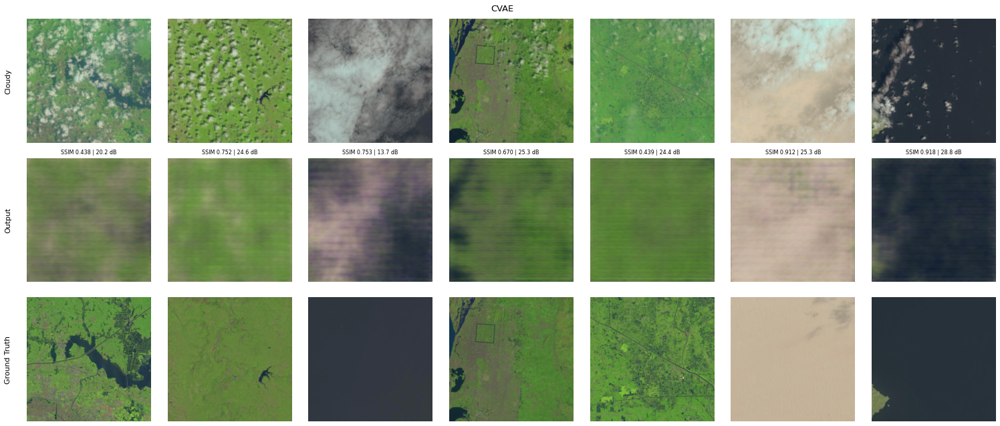

gespeichert: outputs/unet.png


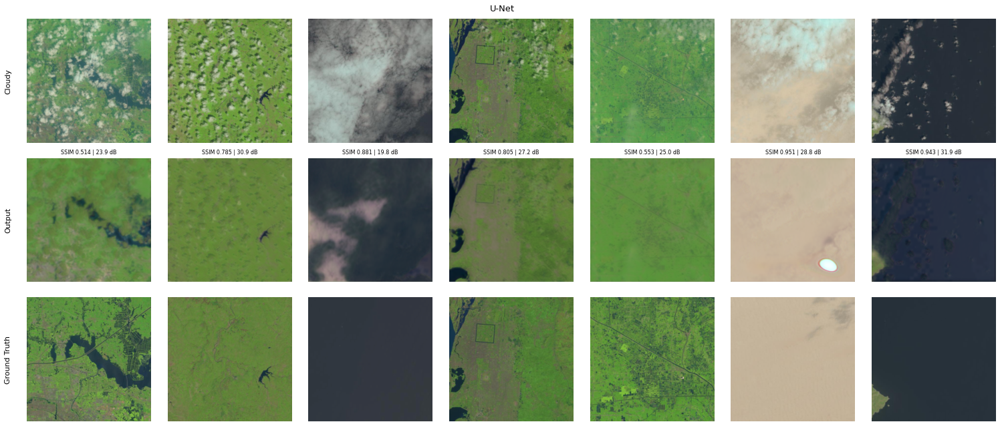

gespeichert: outputs/gan.png


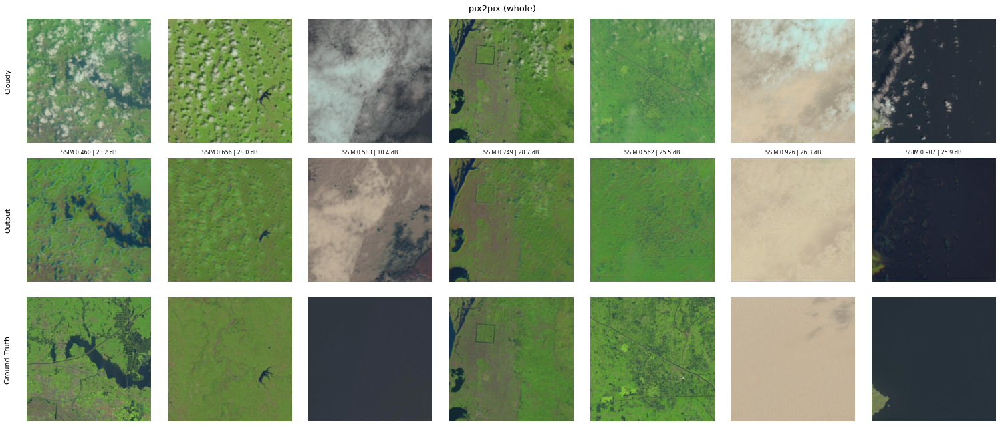

gespeichert: outputs/patch.png


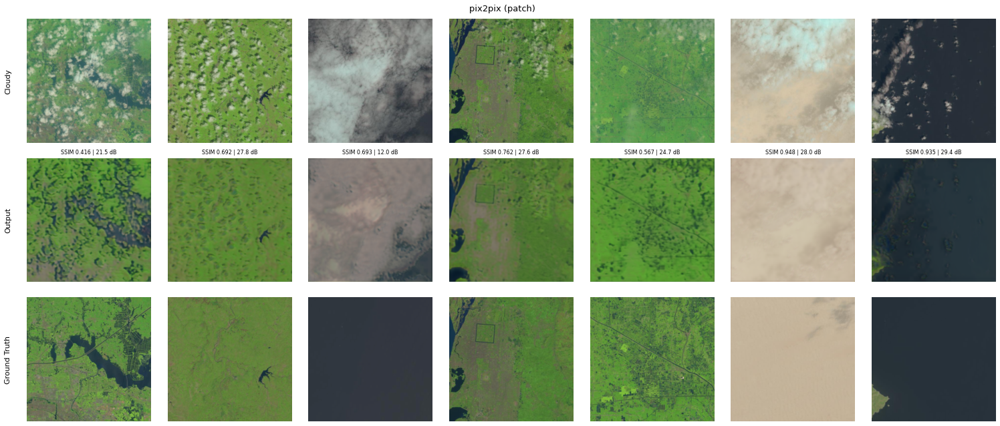

gespeichert: outputs/deep.png


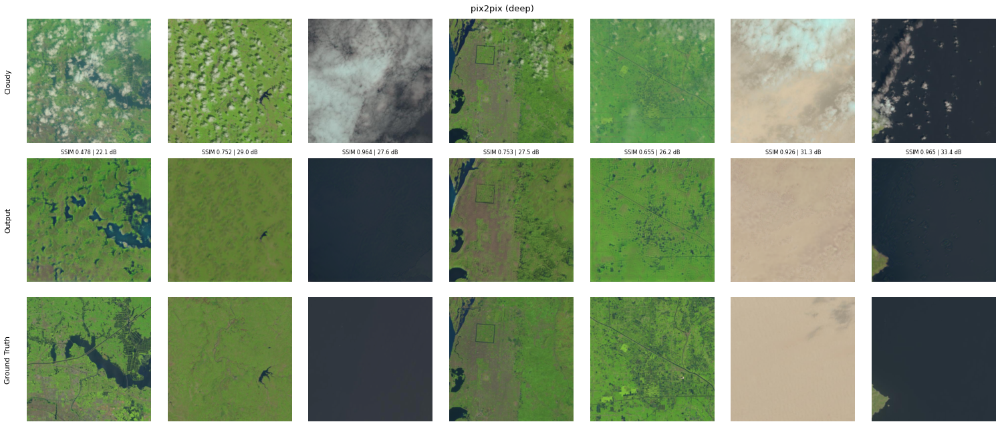

gespeichert: outputs/vergleich1.png


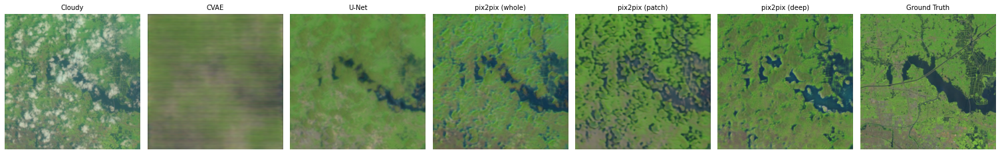

gespeichert: outputs/vergleich2.png


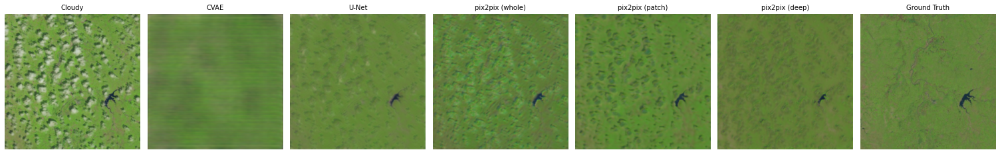

gespeichert: outputs/vergleich3.png


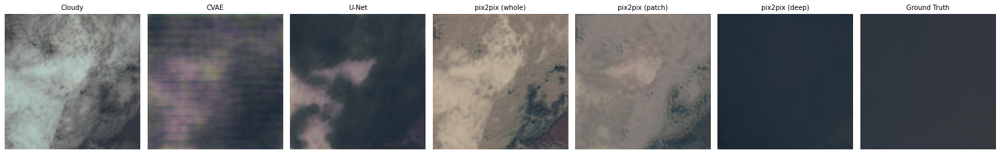

gespeichert: outputs/vergleich4.png


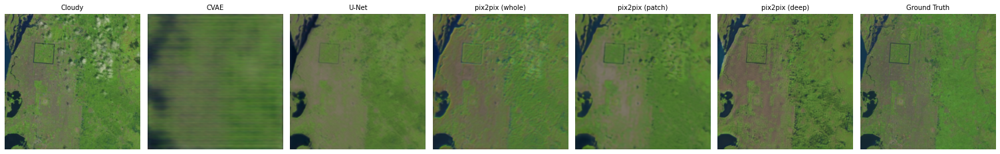

gespeichert: outputs/vergleich5.png


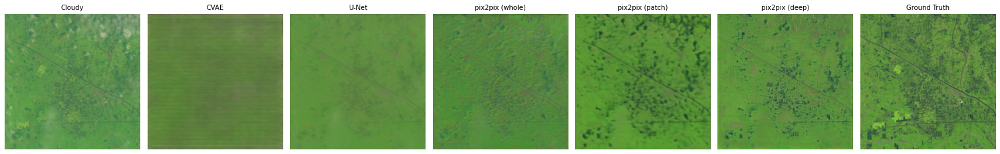

gespeichert: outputs/vergleich6.png


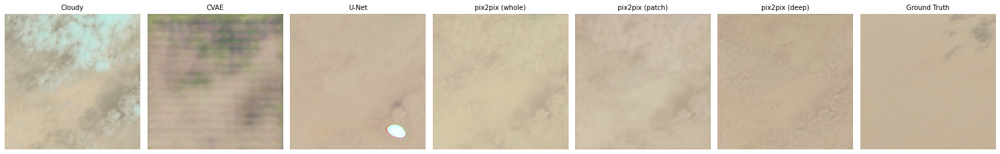

gespeichert: outputs/vergleich7.png


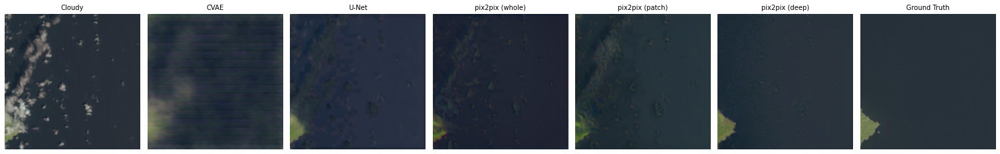

In [ ]:
# Pro Modell-Folie
plot_one_model("CVAE", [5, 17, 35, 41, 66, 87, 92], save_path="outputs/cvae.png")
plot_one_model("U-Net", [5, 17, 35, 41, 66, 87, 92], save_path="outputs/unet.png")
plot_one_model(
    "pix2pix (whole)", [5, 17, 35, 41, 66, 87, 92], save_path="outputs/gan.png"
)
plot_one_model(
    "pix2pix (patch)", [5, 17, 35, 41, 66, 87, 92], save_path="outputs/patch.png"
)
plot_one_model(
    "pix2pix (deep)", [5, 17, 35, 41, 66, 87, 92], save_path="outputs/deep.png"
)
#
# Finale Vergleichsfolie:
plot_single(idx=5, save_path="outputs/vergleich1.png")
plot_single(idx=17, save_path="outputs/vergleich2.png")
plot_single(idx=35, save_path="outputs/vergleich3.png")
plot_single(idx=41, save_path="outputs/vergleich4.png")
plot_single(idx=66, save_path="outputs/vergleich5.png")
plot_single(idx=87, save_path="outputs/vergleich6.png")
plot_single(idx=92, save_path="outputs/vergleich7.png")